Our needs for our model include:
- This needs to be a model able to process labels and predict prices based on different attributes.
- Needs to predict fair market values of properties
- Due to the dataset we plan to use for this project + the predictive nature of what I need, we will be using a supervised regressor model for the price baseline calculation.
- This will allow us to create a general price baseline so that we can detect any major anomalies in the dataset for any anomalous pricing using predictive modeling
- This model ideally should be able to catch nonlinear and linear relationships, as these would be the best 

Possible Models/Algorithms:
- Ridge Regression: This is a linear regressor that penalizes large coefficients; this regressor focuses primarily on linear relationships and acts as a simple model for these relationships; however, it fails to capture nonlinear relationships well, and with the varying attributes of homes could be a major disadvantage
- Random Forest Regressor: This is a regression model related to the popular Random Forest algorithm, using various trees to make classifications and regressions based on supervised learning concepts. This is more suited for nonlinear data models and are more suited for complex patterns. However, these are more susceptible to overfitting due to tree depth as well as slowing down the pipeline due to a more slow model to train.
- LightGBM/XGBoost Regressor: This is a popular gradient boosting type regression model that focuses on capturing more subtle changes and more non-distributed variances. This generally has a higher accuracy and builds on top of each tree's predictions. This is a faster model then its counterpart, XGBoost, which does similar regressive analysis, but trades computative cost for accuracy.

To decide between these various regressors, we have also created metric analysis code in order to do metric analysis and comparison to decide the best models to use for our dataset; Before this though, a few main patterns; due to data processing, these are generally non-linear, so therefore that means XGBoost/LightGBM (gradient regressors) or Random Forest Regressors have a much more likely chance of being useful due to their usage for nonlinear operations and predictive modeling.

In [37]:
%pip install lightgbm
%pip install xgboost
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

df_filled = pd.read_csv("../exploratory_data_analysis/imputed.csv")

target = 'taxvaluedollarcnt'
cols_to_exclude = [target, 'parcelid', 'logerror', 'structuretaxvaluedollarcnt', 'landtaxvaluedollarcnt', 'taxamount']
features = [col for col in df_filled.select_dtypes(include=[np.number]).columns 
            if col not in cols_to_exclude]

X = df_filled[features]
y = df_filled[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(f"Average property price: ${y_test.mean():,.0f}")

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Average property price: $456,236


In [38]:
print("\nActual features used:", features)


Actual features used: ['airconditioningtypeid', 'bathroomcnt', 'bedroomcnt', 'calculatedbathnbr', 'calculatedfinishedsquarefeet', 'finishedsquarefeet12', 'fips', 'fullbathcnt', 'garagecarcnt', 'garagetotalsqft', 'heatingorsystemtypeid', 'latitude', 'longitude', 'lotsizesquarefeet', 'poolcnt', 'pooltypeid7', 'propertylandusetypeid', 'rawcensustractandblock', 'regionidcity', 'regionidcounty', 'regionidneighborhood', 'regionidzip', 'roomcnt', 'unitcnt', 'yearbuilt', 'censustractandblock', 'transaction_month', 'transaction_day', 'transaction_quarter', 'transaction_dayofweek', 'landusecode_encoded', 'zoning_encoded']


In [39]:
correlations = df_filled.corr()['taxvaluedollarcnt'].sort_values(ascending=False)
print(correlations.head(15))

taxvaluedollarcnt               1.000000
landtaxvaluedollarcnt           0.955885
taxamount                       0.951992
structuretaxvaluedollarcnt      0.826561
calculatedfinishedsquarefeet    0.602905
finishedsquarefeet12            0.585786
bathroomcnt                     0.497626
calculatedbathnbr               0.497626
fullbathcnt                     0.480593
bedroomcnt                      0.255903
garagetotalsqft                 0.236991
garagecarcnt                    0.192344
poolcnt                         0.168881
yearbuilt                       0.141105
pooltypeid7                     0.125560
Name: taxvaluedollarcnt, dtype: float64


In [40]:
# evaluation function
def evaluate_model(y_acc, y_pred, model):
    mae = mean_absolute_error(y_acc, y_pred)
    mse = mean_squared_error(y_acc, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_acc, y_pred)
    mape = np.mean(np.abs((y_acc - y_pred) / y_acc)) * 100
    
    print(f"{model} Performance:")
    print(f"  R² Score: {r2:.4f}")
    print(f"  RMSE: ${rmse:,.2f}")
    print(f"  MAE: ${mae:,.2f}")
    print(f"  MAPE: {mape:.2f}%")
    print(f"  RMSE as % of avg price: {(rmse / y_acc.mean()) * 100:.2f}%")

In [44]:
# here, models for price prediction will be trained using their library counterparts, and from there, dependent on the errors 
# and r^2 score, we would decide which one is best through data analysis and the eval function

# Linear Regressor
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)
y_lr_pred = lr.predict(X_test_scaled)

evaluate_model(y_train, y_lr_pred, "Linear Regression")

/opt/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: overflow encountered in expm1
  result = getattr(ufunc, method)(*inputs, **kwargs)
/var/folders/ch/dlmpv6ys6_n_0117y_tdttpw0000gp/T/ipykernel_91140/2689394869.py:22: RuntimeWarning: overflow encountered in expm1
  y_pred_actual = np.expm1(y_pred_log)


ValueError: Input contains infinity or a value too large for dtype('float64').

In [28]:
# Ridge Regressor
ridge = Ridge(alpha=1.0, random_state=42)
ridge.fit(X_train_scaled, y_train)
y_ridge_pred = ridge.predict(X_test_scaled)
y_test_dollars = np.expm1(y_test)
y_ridge_pred_dollars = np.expm1(y_ridge_pred)

mae = mean_absolute_error(y_test_dollars, y_ridge_pred_dollars)
rmse = np.sqrt(mean_squared_error(y_test_dollars, y_ridge_pred_dollars))
r2 = r2_score(y_test_dollars, y_ridge_pred_dollars)

evaluate_model(y_test_dollars, y_ridge_pred_dollars, "Ridge Regression")

Ridge Regression Performance:
  R² Score: -979.6964
  RMSE: $19,021,646.58
  MAE: $368,409.58
  MAPE: 70.13%
  RMSE as % of avg price: 4057.07%


In [27]:
# Random Forest w/ RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

rf_params = {
    'n_estimators': [100, 200, 300, 500],
    'max_depth': [5, 10, 15, 20, 25, 30, None],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4, 8]
}


rand_for = RandomizedSearchCV(RandomForestRegressor(random_state=42, n_jobs=-1), param_distributions=rf_params, n_iter=100, cv=5, scoring='r2', n_jobs=-1)
rand_for.fit(X_train, y_train)
best_rf = rand_for.best_estimator_
print(f"Best CV R²: {rand_for.best_score_:.4f}")
print(f"Best params: {rand_for.best_params_}")
y_rf_pred = best_rf.predict(X_test)
evaluate_model(y_test, y_rf_pred, "Random Forest")

/opt/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Best CV R²: 0.5890
Best params: {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 8, 'max_depth': 25}
Random Forest Performance:
  R² Score: 0.6103
  RMSE: $336,141.17
  MAE: $168,625.24
  MAPE: 73.23%
  RMSE as % of avg price: 73.68%


In [29]:
rand_for = RandomForestRegressor(random_state=42, n_jobs=-1, n_estimators=500, min_samples_split=10, min_samples_leaf=8, max_depth=25)
rand_for.fit(X_train, y_train)
y_rf_pred = rand_for.predict(X_test)
y_test_dollars = np.expm1(y_test)
y_rf_pred_dollars = np.expm1(y_rf_pred)

mae = mean_absolute_error(y_test_dollars, y_rf_pred_dollars)
rmse = np.sqrt(mean_squared_error(y_test_dollars, y_rf_pred_dollars))
r2 = r2_score(y_test_dollars, y_rf_pred_dollars)

evaluate_model(y_test_dollars, y_rf_pred_dollars, "Random Forest")

Random Forest Performance:
  R² Score: 0.4691
  RMSE: $442,569.99
  MAE: $184,970.76
  MAPE: 61.93%
  RMSE as % of avg price: 94.39%


In [28]:
# Gradient Boosting
gbr_params = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 15),
    'learning_rate': uniform(0.01, 0.3)
}
gbr = RandomizedSearchCV(GradientBoostingRegressor(random_state=42), param_distributions=gbr_params, n_iter=100, cv=5, scoring='r2', n_jobs=-1)
gbr.fit(X_train, y_train)
best_gbr = gbr.best_estimator_
print(f"Best CV R²: {gbr.best_score_:.4f}")
print(f"Best params: {gbr.best_params_}")
y_gbr_pred = best_gbr.predict(X_test)
evaluate_model(y_test, y_gbr_pred, "Gradient Boosting")

Best CV R²: 0.5688
Best params: {'learning_rate': 0.048055927919608624, 'max_depth': 4, 'n_estimators': 596}
Gradient Boosting Performance:
  R² Score: 0.6122
  RMSE: $335,314.08
  MAE: $172,160.17
  MAPE: 74.18%
  RMSE as % of avg price: 73.50%


In [30]:
gbr = GradientBoostingRegressor(random_state=42, learning_rate=0.048055927919608624, max_depth=4, n_estimators=596)
gbr.fit(X_train, y_train)
y_gbr_pred = gbr.predict(X_test)
y_test_dollars = np.expm1(y_test)
y_gbr_pred_dollars = np.expm1(y_gbr_pred)

evaluate_model(y_test_dollars, y_gbr_pred_dollars, "Gradient Boosting")

Gradient Boosting Performance:
  R² Score: 0.4806
  RMSE: $437,771.56
  MAE: $184,279.84
  MAPE: 61.86%
  RMSE as % of avg price: 93.37%


In [29]:
# LightGBM

lgbm_params = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 15),
    'learning_rate': uniform(0.01, 0.3),
    'num_leaves': randint(10, 100)
}
lgbm = RandomizedSearchCV(LGBMRegressor(random_state=42, n_jobs=-1), param_distributions=lgbm_params, n_iter=100, cv=5, scoring='r2', n_jobs=-1)
lgbm.fit(X_train, y_train)
best_lgbm = lgbm.best_estimator_
print(f"Best CV R²: {lgbm.best_score_:.4f}")
print(f"Best params: {lgbm.best_params_}")
y_lgbm_pred = best_lgbm.predict(X_test)
evaluate_model(y_test, y_lgbm_pred, "LightGBM")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033944 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3323
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3329
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3326
[LightGBM] [Info] Number of data points in the train set: 56861, number of used features: 32
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022125 seconds.
You can set `force_row_

In [10]:
lgbm = LGBMRegressor(random_state=42)
lgbm.fit(X_train, y_train)
y_lgbm_pred = lgbm.predict(X_test)
y_test_dollars = np.expm1(y_test)
y_lgbm_pred_dollars = np.expm1(y_lgbm_pred)

mae = mean_absolute_error(y_test_dollars, y_lgbm_pred_dollars)
rmse = np.sqrt(mean_squared_error(y_test_dollars, y_lgbm_pred_dollars))
r2 = r2_score(y_test_dollars, y_lgbm_pred_dollars)

evaluate_model(y_test_dollars, y_lgbm_pred_dollars, "LightGBM")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3337
[LightGBM] [Info] Number of data points in the train set: 71077, number of used features: 32
[LightGBM] [Info] Start training from score 458610.738256
LightGBM Performance:
  R² Score: 0.6023
  RMSE: $339,578.75
  MAE: $172,628.09
  MAPE: 75.14%
  RMSE as % of avg price: 74.43%


In [1]:
# XGBoost

xgb_params = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(3, 15),
    'learning_rate': uniform(0.01, 0.3)
}
xgb = RandomizedSearchCV(XGBRegressor(random_state=42, n_jobs=-1), param_distributions=xgb_params, n_iter=100, cv=5, scoring='r2', n_jobs=-1)
xgb.fit(X_train, y_train)
best_xgb = xgb.best_estimator_
print(f"Best CV R²: {xgb.best_score_:.4f}")
print(f"Best params: {xgb.best_params_}")
y_xgb_pred = best_xgb.predict(X_test)
evaluate_model(y_test, y_xgb_pred, "XGB Regressor")

NameError: name 'randint' is not defined

In [11]:
xgb = XGBRegressor(random_state=42)
xgb.fit(X_train, y_train)
y_xgb_pred = xgb.predict(X_test)
y_test_dollars = np.expm1(y_test)
y_xgb_pred_dollars = np.expm1(y_xgb_pred)

mae = mean_absolute_error(y_test_dollars, y_xgb_pred_dollars)
rmse = np.sqrt(mean_squared_error(y_test_dollars, y_xgb_pred_dollars))
r2 = r2_score(y_test_dollars, y_xgb_pred_dollars)

evaluate_model(y_test_dollars, y_lgbm_pred_dollars, "XGB Regressor")

XGB Regressor Performance:
  R² Score: 0.5658
  RMSE: $354,828.96
  MAE: $172,769.08
  MAPE: 73.52%
  RMSE as % of avg price: 77.77%


In [ ]:
#Experimentation w Meta + Ensemble Models

stacked_gbr = GradientBoostingRegressor()



Price Prediction to Anomaly Detection

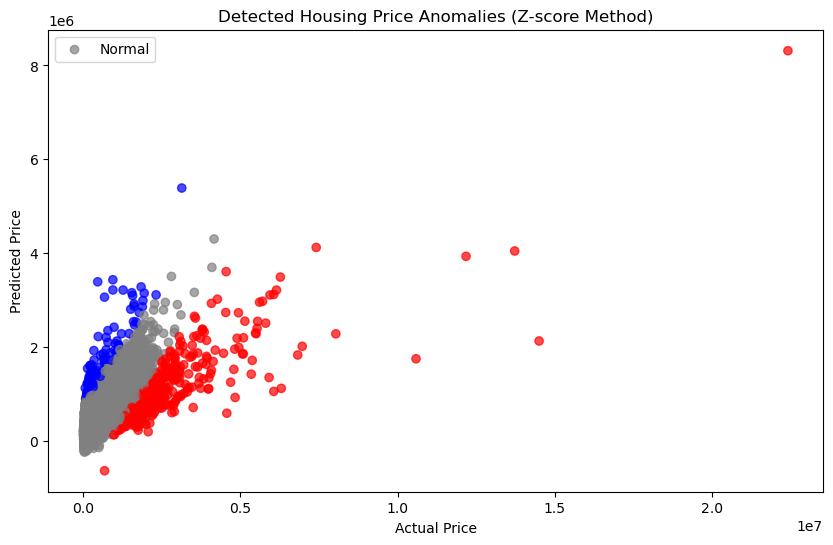

In [12]:
from models import detect_anomalies

anomalies_z = detect_anomalies(y_test, y_lr_pred, method="zscore")

anomalies_z.head(10)

anomalies_if = detect_anomalies(y_test, y_lr_pred, method="isolation_forest", contamination=0.05)
anomalies_if.head(10)

plt.figure(figsize=(10,6))
plt.scatter(anomalies_z["Actual Price"], anomalies_z["Predicted Price"],
            c=np.where(anomalies_z["Anomaly Type"]=="Normal", "gray",
            np.where(anomalies_z["Anomaly Type"]=="Overpriced", "red", "blue")),
            alpha=0.7)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Detected Housing Price Anomalies (Z-score Method)")
plt.legend(["Normal", "Overpriced", "Underpriced"])
plt.show()

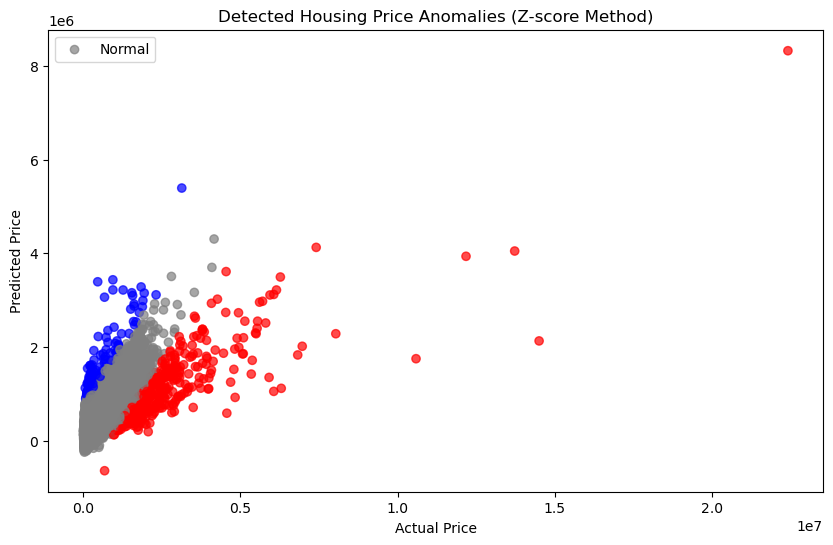

In [13]:
from models import detect_anomalies

anomalies_z = detect_anomalies(y_test, y_ridge_pred, method="zscore")

anomalies_z.head(10)

anomalies_if = detect_anomalies(y_test, y_ridge_pred, method="isolation_forest", contamination=0.05)
anomalies_if.head(10)

plt.figure(figsize=(10,6))
plt.scatter(anomalies_z["Actual Price"], anomalies_z["Predicted Price"],
            c=np.where(anomalies_z["Anomaly Type"]=="Normal", "gray",
            np.where(anomalies_z["Anomaly Type"]=="Overpriced", "red", "blue")),
            alpha=0.7)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Detected Housing Price Anomalies (Z-score Method)")
plt.legend(["Normal", "Overpriced", "Underpriced"])
plt.show()

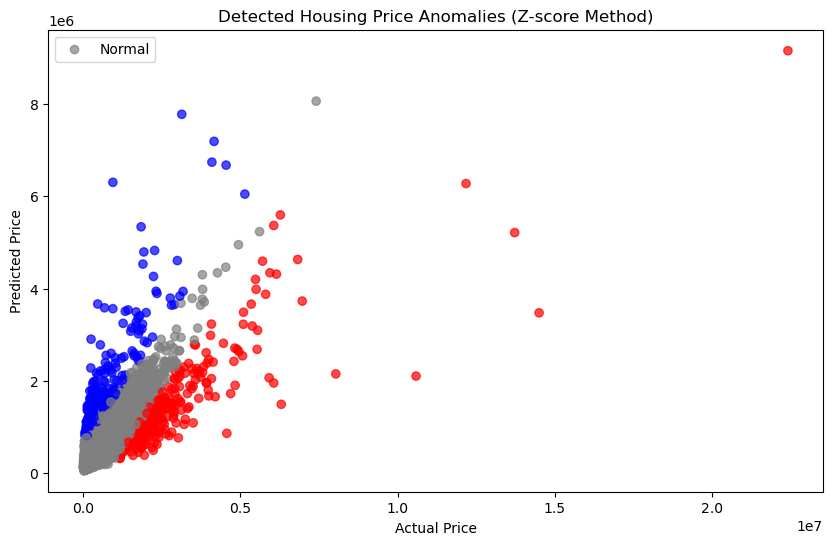

In [14]:
from models import detect_anomalies

anomalies_z = detect_anomalies(y_test, y_rf_pred, method="zscore")

anomalies_z.head(10)

anomalies_if = detect_anomalies(y_test, y_rf_pred, method="isolation_forest", contamination=0.05)
anomalies_if.head(10)

plt.figure(figsize=(10,6))
plt.scatter(anomalies_z["Actual Price"], anomalies_z["Predicted Price"],
            c=np.where(anomalies_z["Anomaly Type"]=="Normal", "gray",
            np.where(anomalies_z["Anomaly Type"]=="Overpriced", "red", "blue")),
            alpha=0.7)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Detected Housing Price Anomalies (Z-score Method)")
plt.legend(["Normal", "Overpriced", "Underpriced"])
plt.show()

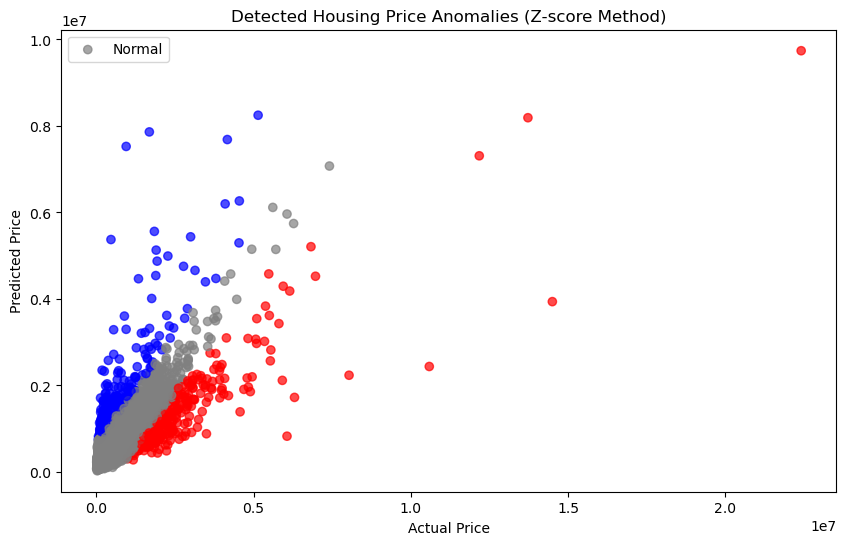

In [15]:
from models import detect_anomalies

anomalies_z = detect_anomalies(y_test, y_gbr_pred, method="zscore")

anomalies_z.head(10)

anomalies_if = detect_anomalies(y_test, y_gbr_pred, method="isolation_forest", contamination=0.05)
anomalies_if.head(10)

plt.figure(figsize=(10,6))
plt.scatter(anomalies_z["Actual Price"], anomalies_z["Predicted Price"],
            c=np.where(anomalies_z["Anomaly Type"]=="Normal", "gray",
            np.where(anomalies_z["Anomaly Type"]=="Overpriced", "red", "blue")),
            alpha=0.7)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Detected Housing Price Anomalies (Z-score Method)")
plt.legend(["Normal", "Overpriced", "Underpriced"])
plt.show()

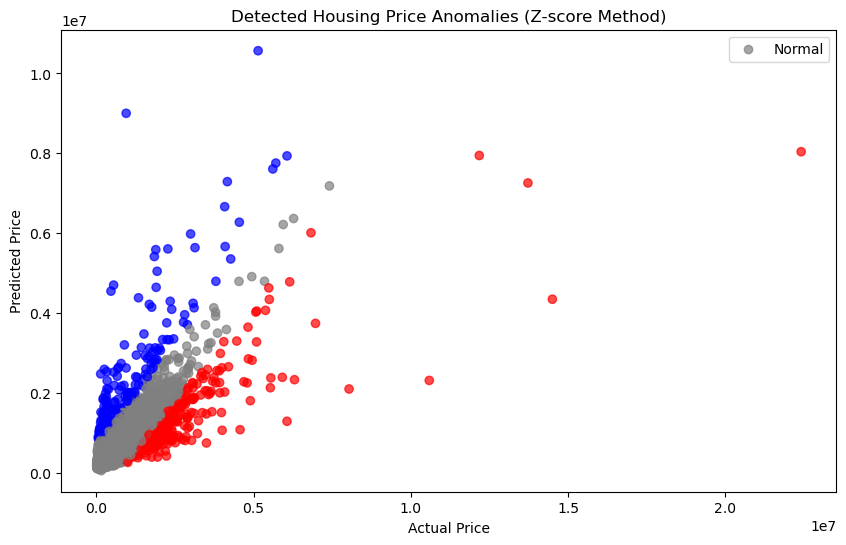

In [16]:
from models import detect_anomalies

anomalies_z = detect_anomalies(y_test, y_lgbm_pred, method="zscore")

anomalies_z.head(10)

anomalies_if = detect_anomalies(y_test, y_lgbm_pred, method="isolation_forest", contamination=0.05)
anomalies_if.head(10)

plt.figure(figsize=(10,6))
plt.scatter(anomalies_z["Actual Price"], anomalies_z["Predicted Price"],
            c=np.where(anomalies_z["Anomaly Type"]=="Normal", "gray",
            np.where(anomalies_z["Anomaly Type"]=="Overpriced", "red", "blue")),
            alpha=0.7)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Detected Housing Price Anomalies (Z-score Method)")
plt.legend(["Normal", "Overpriced", "Underpriced"])
plt.show()

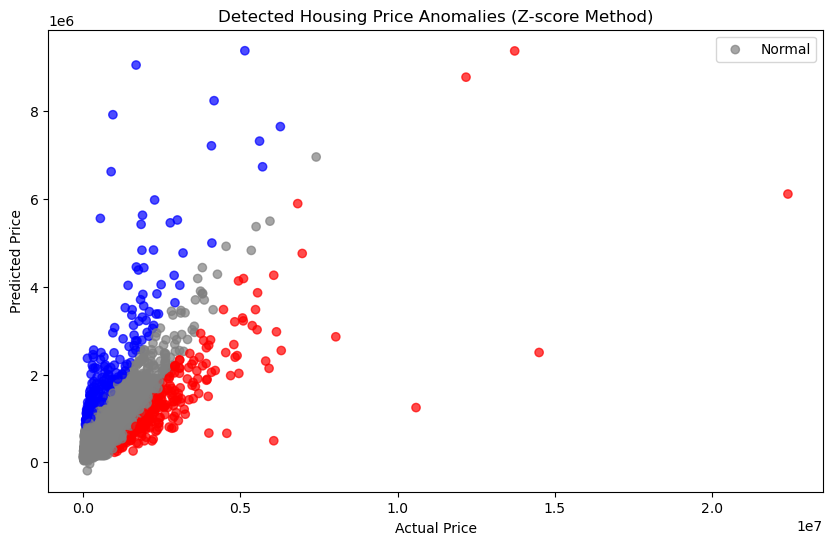

In [17]:
from models import detect_anomalies

anomalies_z = detect_anomalies(y_test, y_xgb_pred, method="zscore")

anomalies_z.head(10)

anomalies_if = detect_anomalies(y_test, y_xgb_pred, method="isolation_forest", contamination=0.05)
anomalies_if.head(10)

plt.figure(figsize=(10,6))
plt.scatter(anomalies_z["Actual Price"], anomalies_z["Predicted Price"],
            c=np.where(anomalies_z["Anomaly Type"]=="Normal", "gray",
            np.where(anomalies_z["Anomaly Type"]=="Overpriced", "red", "blue")),
            alpha=0.7)
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")
plt.title("Detected Housing Price Anomalies (Z-score Method)")
plt.legend(["Normal", "Overpriced", "Underpriced"])
plt.show()